In [1]:
from PIL import Image
import cv2 as cv
import os
import sys
from tqdm.notebook import tqdm
from dotenv import load_dotenv
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from ultralytics import YOLO
from skimage import restoration

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
from utils.plot_wrapper import *
from utils.fix_resolutions import *
from utils import brisque

In [2]:
root = os.getenv("root", ".")

tiger_name = "K 15 M"

In [3]:
data_path = os.path.join(root, "data")
tiger_path = os.path.join(data_path, tiger_name)

images = [cv.imread(os.path.join(tiger_path, f)) for f in os.listdir(tiger_path)]
images = [cv.cvtColor(img, cv.COLOR_BGR2RGB) for img in images]

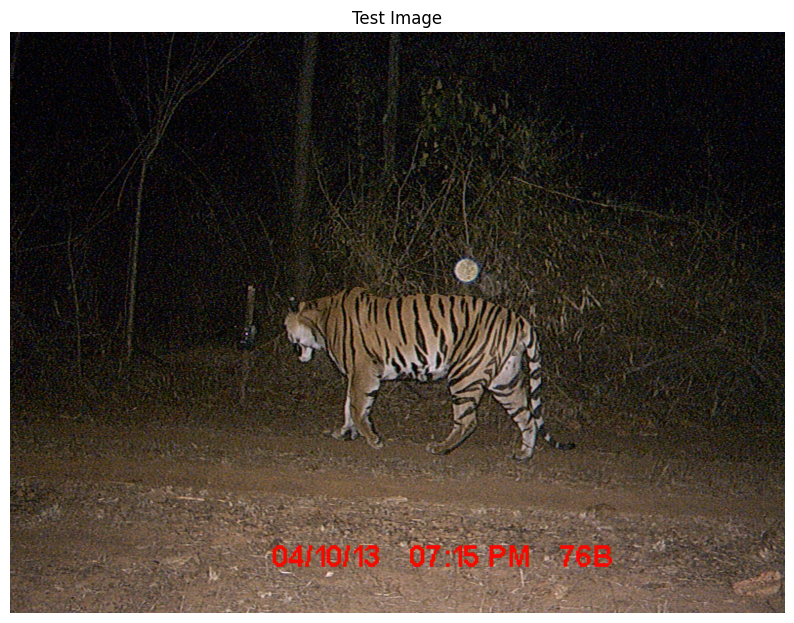

In [4]:
test_image = images[0]
plot_image(test_image, title="Test Image")

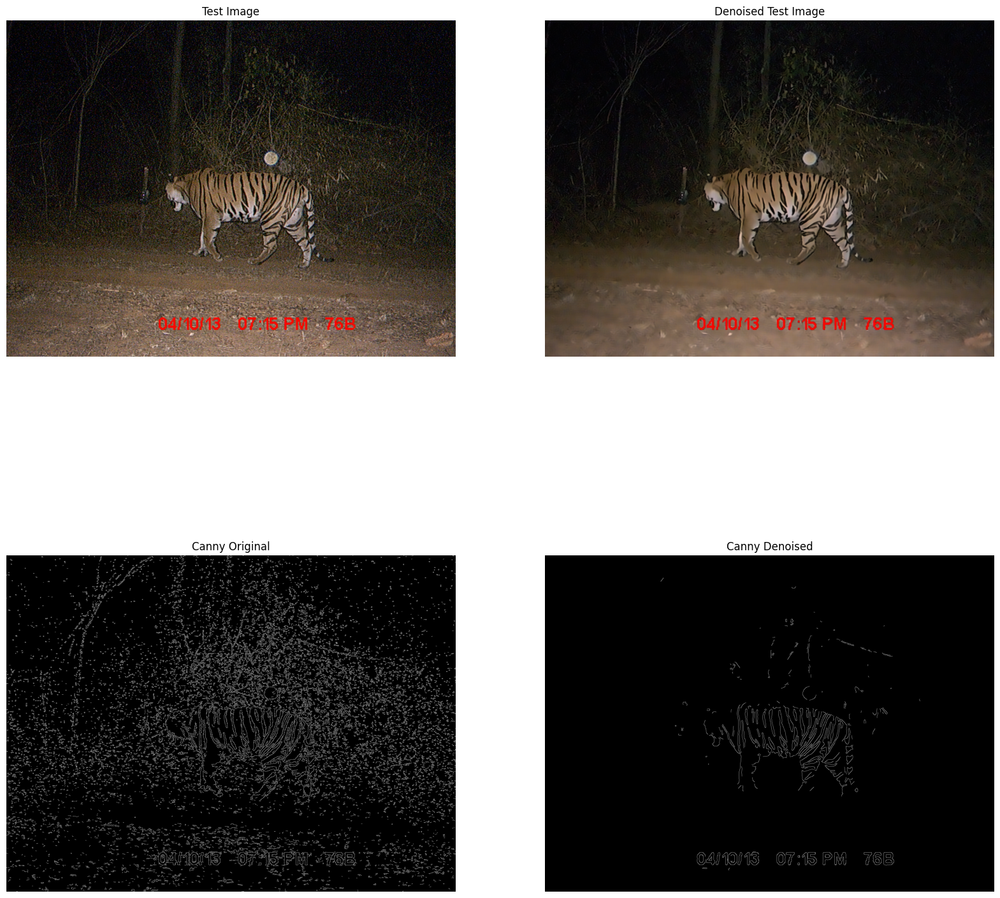

In [5]:
denoised = cv.fastNlMeansDenoisingColored(test_image, None, 20, 20, 11, 31)

canny = cv.Canny(test_image, 150, 250)
canny_denoised = cv.Canny(denoised, 150, 250)

plot_images([test_image, denoised, canny, canny_denoised], titles=["Test Image", "Denoised Test Image", "Canny Original", "Canny Denoised"], cols=2, cmap="gray")

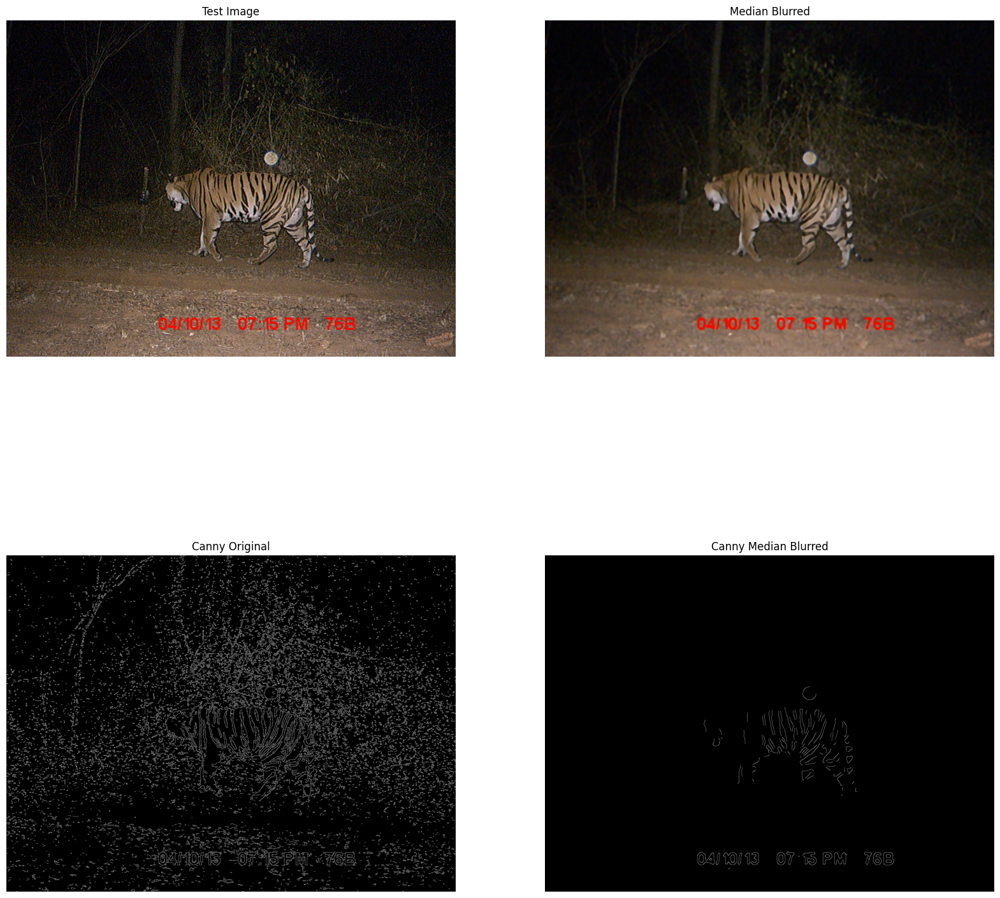

In [6]:
median_blurred = cv.medianBlur(test_image, 15)

median_blurred_canny = cv.Canny(median_blurred, 150, 250)
plot_images([test_image, median_blurred, canny, median_blurred_canny], titles=["Test Image", "Median Blurred", "Canny Original", "Canny Median Blurred"], cols=2, cmap="gray")

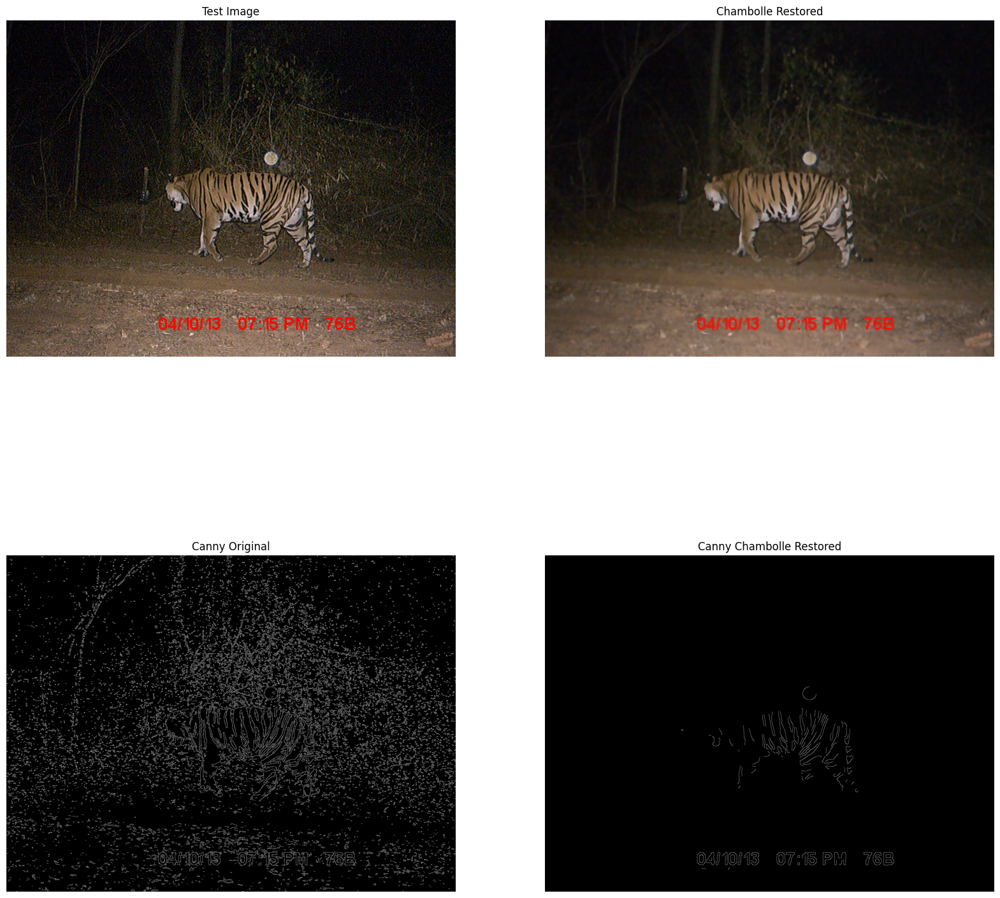

In [7]:
chambolle_restored = restoration.denoise_tv_chambolle(test_image, weight=0.4, channel_axis=-1)

chambolle_canny = cv.Canny((chambolle_restored * 255).astype(np.uint8), 150, 250)
plot_images([test_image, chambolle_restored, canny, chambolle_canny], titles=["Test Image", "Chambolle Restored", "Canny Original", "Canny Chambolle Restored"], cols=2, cmap="gray")

  0%|          | 0/8 [00:00<?, ?it/s]

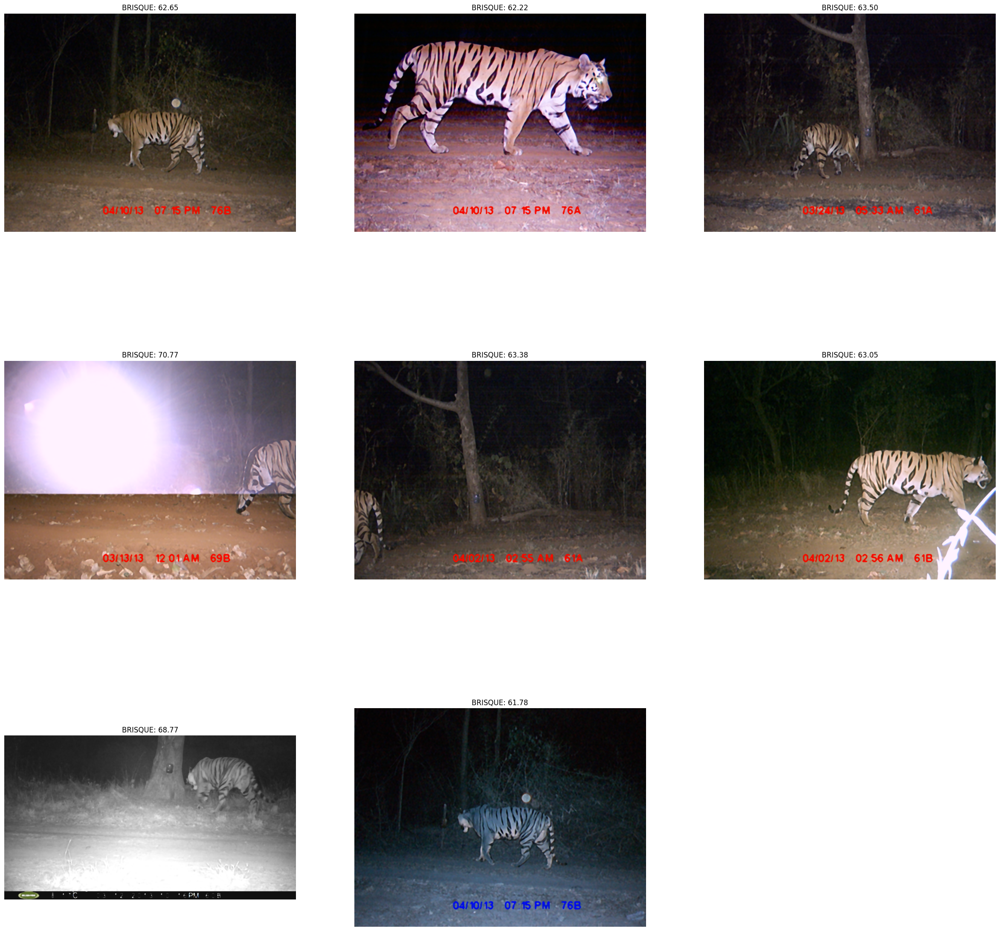

In [8]:
median_blurred_images = [cv.medianBlur(img, 15) for img in images]
brisque_scores = [brisque.test_measure_BRISQUE(img, is_img=True, model_path=os.path.join(root, "utils", "allmodel.txt")) for img in tqdm(median_blurred_images)]
plot_images(median_blurred_images, cols=3, titles=[f"BRISQUE: {score:.2f}" for score in brisque_scores])

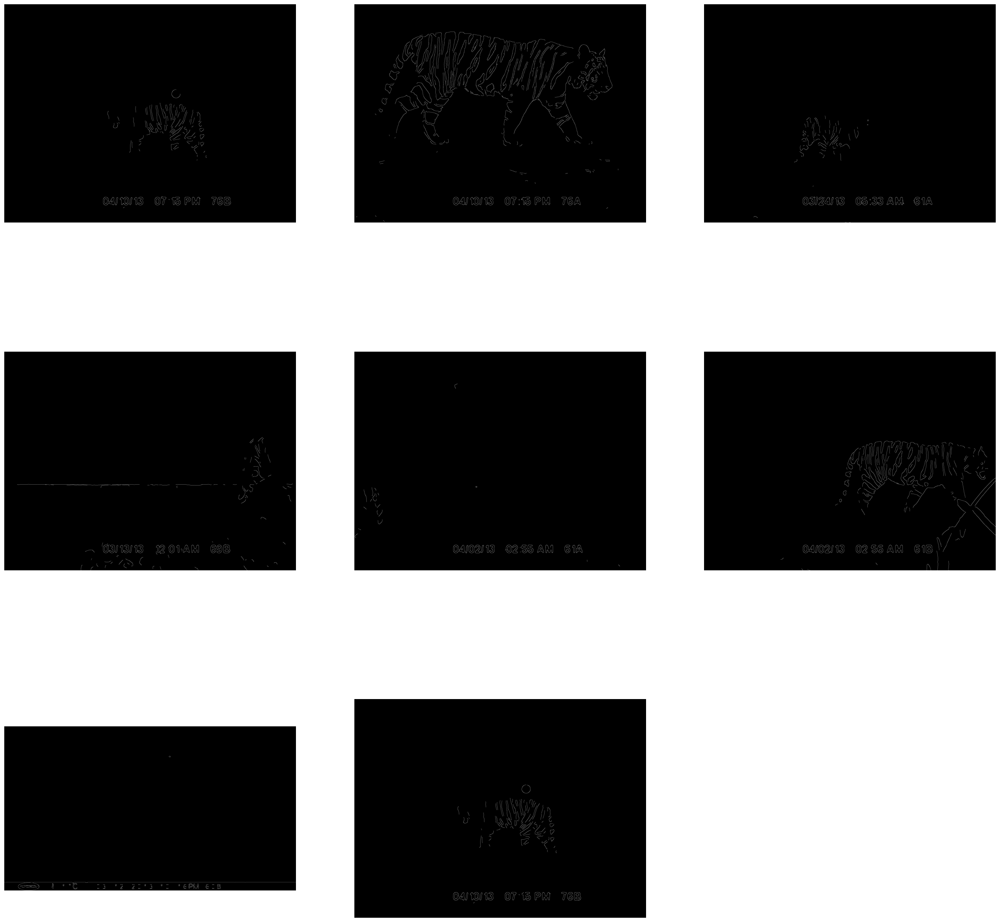

In [9]:
median_blurred_canny_images = [cv.Canny(img, 150, 250) for img in median_blurred_images]
plot_images(median_blurred_canny_images, cols=3, cmap="gray")